## Author

Student Name: Adil Khan

Student Number: 231146322

# **Problem Formulation**

The problem I'm looking to solve for this mini-project is building a machine-learning model that predicts whether a narrated story is true or false, based on the first 30 seconds of an audio recording. What makes this so interesting to me is the challenge of detecting a lie. It's not easy to catch someone in a lie, especially if they're good at it. But if we can detect a lie by picking up on subtle changes in speech, pitch, or tone, that’s a huge win. The dataset I’m working with contains 100 audio samples, each labeled as either true or false, along with the language used. The tricky part is making sure the model doesn’t just memorize the data but can actually generalize well, especially given the small size of the dataset. This problem is fascinating because, if I can solve it, it could have real-world applications in areas like interviews or customer service, where being able to tell if someone is being truthful could make a difference.

#**Methodology**

The methodology for this project will involve training different machine-learning models to understand whether a narrated story is true or deceptive. This process starts with **preprocessing** the raw audio data to ensure everything is clear and consistent. The audio is resampled to 16 kHz to standardise it because the recordings might have been made at different sampling rates. Using 16 kHz improves the model’s efficiency, reducing unnecessary data while keeping the important speech frequencies. It’s a common choice in speech processing because it keeps the key vocal information and gets rid of high-frequency noise we don’t need. On top of this, each audio recording is trimmed to 30 seconds to make sure all the files are the same length.

Once preprocessing is done, relevant features like **MFCCs** (Mel-frequency cepstral coefficients) are extracted. MFCCs are widely used in speech and audio analysis because they mimic how humans perceive sound. They represent audio signals on the Mel scale, which focuses on frequencies that matter most to human hearing and reduces the impact of less important ones, which makes this ideal for capturing the tonal quality of speech which is essential for distinguishing between true and deceptive stories, additionally features like **pitch, energy and spectral properties** are extracted to numerically represent the audio.

To reduce dimensionality and to retain most of the critical insights, **Principal Component Analysis** (PCA) is applied, reducing the features to 10 components. The extracted audio features, such as MFCCs and spectral properties, result in high dimensionality, which can cause inefficiencies in the machine learning models and increase computational complexity. High-dimensional data can also introduce noise and redundancy, making it harder for models to generalize well to unseen data. PCA resolves this by transforming the original features into a smaller set of uncorrelated components that explain the majority of the variance in the data. This transformation not only simplifies the dataset but also highlights the most significant patterns, enabling the models to learn these patterns more easily. Four classifiers are trained on the PCA-reduced features:

#Principle Component Analysis & Random Forest Classifier

The first model trained on the PCA-reduced features is a **Random Forest classifier**, which works well with high-dimensional data and is robust to noise. The Random Forest is trained on 80% of the dataset, where it learns to classify the audio narratives as true or deceptive based on the transformed features. During the validation phase, the model’s performance is evaluated on the remaining 20% of the data, using metrics like accuracy and analyzing the confusion matrix. Random Forest uses a group of decision trees to make predictions, combining multiple trees to improve accuracy and reduce overfitting. PCA ensures that redundant features are removed, making the data easier for the decision trees to interpret and improving the overall efficiency of the training process

#Principle Component Analysis & Support Vector Machines


The second model is a **Support Vector Machine (SVM)** with a linear kernel, which works well with smaller datasets and linearly separable data. Like the Random Forest, the SVM is trained on the PCA-reduced features from the training data, using the reduced dimensionality to pick up patterns in the data more effectively. The SVM uses the linear kernel to create a hyperplane that separates the two classes in the reduced feature space. Validation is carried out on the test data to check how well the model generalizes, using the same performance metrics as the Random Forest. By combining PCA and SVM, the model focuses on the most important features, cuts out noise, avoids overfitting, and runs efficiently during both training and validation.

#Principle Component Analysis & Logistic Regression

The third model trained on the PCA-reduced features is **Logistic Regression**, which is ideal for binary classification problems like this. Logistic Regression assumes a linear relationship between the features and the output labels, so it works really well with the simplified PCA-transformed data. The model is trained on 80% of the dataset, learning to tell apart true and deceptive stories based on these reduced features. Its performance is then tested on the remaining 20% using accuracy and a confusion matrix to see how well it’s doing. What’s great about Logistic Regression is that it’s simple, easy to interpret, and shows which features are influencing the predictions the most. Combining PCA with Logistic Regression helps focus on the key patterns in the data, making the training process both efficient and reliable.

#Principle Component Analysis & K-Nearest Neighbours

The fourth model trained on the PCA-reduced features is **K-Nearest Neighbours (KNN)**, which is a straightforward method that classifies a sample by looking at its closest neighbors in the feature space. By using PCA, the data is simplified, which makes KNN run more efficiently and helps it focus on the important patterns. KNN is trained on 80% of the data, where it learns to classify true and deceptive stories by checking the labels of the nearest k neighbours. It’s then tested on the other 20% to see how accurate it is, using accuracy and a confusion matrix. KNN is easy to understand and adapts to the structure of the data, but it’s sensitive to how the number of neighbours and the distance metric are chosen. Using PCA with KNN ensures the data is compact and meaningful, making it easier for the model to generalize while keeping things computationally efficient.



#**Implemented ML Prediction Pipelines**

#4.1 Transformation Stage

The transformation stage is where the raw audio data is processed to get it ready for the machine-learning models. The input data is made up of 100 .wav files, each containing a 2-minute narrated story. The audio is resampled to 16 kHz to standardise the sampling rate across all recordings. This ensures all the samples have the same frequency resolution because different sample rates can cause inconsistencies during feature extraction. Each audio file is then trimmed to 30 seconds to make sure they’re all the same length. Features such as MFCCs (already discussed in the methodology), energy, pitch, and spectral properties are extracted to represent the audio numerically. MFCCs are calculated as 13 coefficients that summarise the tonal and frequency characteristics of the speech, and these coefficients are averaged over the audio to create a compact fixed-size vector for each sample. Pitch and energy features are added to capture changes in voice tone and intensity, while spectral properties like spectral centroid and bandwidth provide extra insights into the frequency distribution in the audio. Together, these features form a detailed numerical representation of each recording, helping to capture patterns that could show the difference between true and deceptive speech.

After extracting the features, PCA is used to reduce the dimensionality of the data. PCA transforms the features into a 10-dimensional space, where each row of the output matrix represents the most important components for one audio file. The result of this stage is a standardised, PCA-reduced feature matrix that’s ready for training the machine-learning models.

#4.2 Model Stage


In the model stage, two machine learning classifiers are trained on the PCA-reduced features. First, the Random Forest classifier is used, which works by combining a group of decision trees to classify the narratives as true or deceptive. Each tree makes splits in the data to identify patterns, and the final prediction is based on the majority vote across all the trees. Random Forest is great at capturing non-linear patterns in the data, making it suitable for complex datasets like this one. Another reason I like this approach is that it’s robust to noise and less likely to Overfit compared to a single decision tree because it averages out the predictions of multiple trees. It’s also relatively easy to train and tune, and it can give insights into which features are most important, which is useful for understanding how the model makes decisions.


The second model is the SVM, which works well with smaller datasets and linearly separable data in a reduced feature space. SVM creates a hyperplane that separates the two classes in the PCA-transformed 10-dimensional space. The linear kernel keeps it computationally efficient while maximizing the margin between the closest points of each class, known as the support vectors. This makes it good at reducing classification errors and generalizing to new data. I picked SVM because it works well with the reduced features from PCA, focusing on the most important components and ignoring unnecessary ones. It’s also a great choice for binary classification tasks like this because it creates a clear boundary between the two classes. Plus, since my dataset is fairly small, SVM is ideal because it performs reliably well even when there aren’t a lot of samples.

The third model I’m using is Logistic Regression, which is great for binary classification problems. It works well with PCA-reduced data because it assumes a linear relationship between the features and the target labels. After PCA simplifies the dataset by focusing on the most important components, Logistic Regression uses these components to classify the narratives as true or deceptive. I chose this model because it’s simple, easy to interpret, and computationally efficient, which is perfect for smaller datasets. Plus, it gives insights into how each feature contributes to the predictions, making it a great choice for understanding the classification process.

The fourth model I’m using is the KNN, which classifies samples based on their proximity to others in the feature space. Using PCA simplifies the data, which helps KNN run faster and focus on the key patterns in the data. I picked this model because it’s straightforward and works well when the data is grouped into clear patterns. However, it does require tuning the number of neighbours to get the best results. Despite its simplicity, KNN is a good choice for this project because it complements the other models and gives another perspective on classifying the narratives.

#4.3 Ensemble Stage

The ensemble stage combines predictions from four models: Random Forest, SVM, Logistic Regression, and KNN to take advantage of their individual strengths. Random Forest is great at picking up non-linear patterns, SVM works well when the data is linearly separable after PCA, Logistic Regression is simple, and efficient, while KNN uses proximity-based classification to bring a different perspective. By using majority voting, this approach balances out the strengths of all the models and minimizes their weaknesses. Combining their predictions helps improve accuracy and makes the results more robust, giving a more reliable way to classify the stories as true or deceptive. Including multiple models in the ensemble adds diversity to the predictions, which helps to create a more well-rounded and dependable outcome.



#**Dataset**

The dataset for this Mini-Project is created from the MLEnd Deception Dataset, which consists of 100 audio files labelled as a true story or deceptive stories. These files are preprocessed to ensure consistency. Each audio file is resampled to 16 kHz and standardized to 30 seconds in length through trimming/ zero-padding. The dataset is then split into a training set (80%) and a test set (20%) using stratified sampling to ensure that the class distribution is consistent across both subsets. The training set is used to train the models, while the test set serves as independent data for evaluating performance. A fixed random state ensures the splits are reproducible.

That said, there are a few limitations to keep in mind. The dataset size is quite small, which could make it harder for the models to generalize well to new, unseen data. Noise in the recordings or inconsistent audio quality might also affect how well features are extracted, potentially impacting model performance. While stratified sampling balances the class distribution, having a limited number of samples per class still makes the dataset vulnerable to overfitting, especially for more complex models. Another issue is that the audio only represents 30 seconds of speech, which might not fully capture the patterns needed to distinguish between true and deceptive stories, depending on the dataset’s variety. These limitations must be considered when interpreting the results.

#**CODE**

In [1]:
# Importing Libraries

from google.colab import drive
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os
import librosa
#Principle Component Analysis
from sklearn.decomposition import PCA
#Random Forest Classifier
from sklearn.ensemble import RandomForestClassifier
#Support Vector Machines
from sklearn.svm import SVC
#Logistic Regression
from sklearn.linear_model import LogisticRegression
#K-Nearest Neighbors
from sklearn.neighbors import KNeighborsClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
import IPython.display as ipd
from tqdm import tqdm
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from scipy.stats import mode

drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
pip install mlend==1.0.0.4

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 64.4/64.4 kB 1.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.3/4.3 MB 41.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 79.4 MB/s eta 0:00:00
  Created wheel for python-picard: filename=python_picard-0.8-py3-none-any.whl size=16394 sha256=a9558f45c28945b74740c3235e59526074c343d55ce09e6648e4ba2eb1710547
  Stored in directory: /root/.cache/pip/wheels/d7/2d/9f/cdbaa870f73d637972241ec2213760c7efb6ac88880a19ba91
Successfully built python-picard


In [3]:
import mlend # Importing mlend library
from mlend import download_deception_small, deception_small_load

# Downloading the Dataset
datadir = download_deception_small(save_to='MLEnd', subset={}, verbose=1, overwrite=False)
# Loading the Dataset
TrainSet, TestSet, MAPs = deception_small_load(datadir_main=datadir, train_test_split=None, verbose=1, encode_labels=True)

# Extracting the Audio directory
audio_dir = os.path.join(datadir, 'MLEndDD_stories_small')
# Listing the Audio files
audio_files = [f for f in os.listdir(audio_dir) if f.endswith('.wav')]
# Loading the MLEndDD_story_attributes_small.csv file
csv_file = os.path.join(datadir, 'MLEndDD_story_attributes_small.csv')
# Reading the CSV file
MLEnd_df = pd.read_csv(csv_file)

# Defining the label mapping to binary values, true story = 1 , deceptive story = 0
label_mapping = {'true_story': 1, 'deceptive_story': 0}

# Combining file paths and labels using the mapping
audio_files_and_labels = [
    (os.path.join(audio_dir, row['filename']), label_mapping[row['Story_type']])
    for _, row in MLEnd_df.iterrows()
]


<frozen importlib._bootstrap>:914: ImportWarning: _PyDrive2ImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _PyDriveImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _GenerativeAIImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _OpenCVImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: APICoreClientInfoImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _BokehImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _AltairImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _PyDrive2ImportHook.find_spec() not found; falling back to find_module()
<frozen impo

  1%|                                                  |100\1|00001.wav

<frozen importlib._bootstrap>:914: ImportWarning: _PyDrive2ImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _PyDriveImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _GenerativeAIImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _OpenCVImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: APICoreClientInfoImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _BokehImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _AltairImportHook.find_spec() not found; falling back to find_module()


100%|▓▓▓▓▓▓▓▓▓▓▓▓▓▓▓▓▓▓▓▓▓▓▓▓▓▓▓▓▓▓▓▓▓▓▓▓▓▓▓▓▓▓▓▓▓▓▓▓▓▓|100\100|00100.wav
Done!
Total 100 found in MLEnd/deception/MLEndDD_stories_small/


In [4]:
# Displaying the categories in the column story type
print(MLEnd_df['Story_type'].unique())

['deceptive_story' 'true_story']


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.


In [5]:
# Defining the audio path directory
audio_dir = os.path.join(datadir, 'MLEndDD_stories_small')
# Listing the files in the audio directory
print(os.listdir(audio_dir))

['00020.wav', '00024.wav', '00071.wav', '00069.wav', '00023.wav', '00029.wav', '00090.wav', '00038.wav', '00088.wav', '00062.wav', '00003.wav', '00049.wav', '00043.wav', '00055.wav', '00056.wav', '00025.wav', '00078.wav', '00087.wav', '00030.wav', '00010.wav', '00058.wav', '00074.wav', '00026.wav', '00016.wav', '00014.wav', '00065.wav', '00042.wav', '00050.wav', '00059.wav', '00085.wav', '00017.wav', '00098.wav', '00021.wav', '00047.wav', '00051.wav', '00006.wav', '00005.wav', '00018.wav', '00037.wav', '00031.wav', '00044.wav', '00082.wav', '00009.wav', '00039.wav', '00097.wav', '00057.wav', '00045.wav', '00004.wav', '00007.wav', '00061.wav', '00032.wav', '00001.wav', '00066.wav', '00084.wav', '00015.wav', '00100.wav', '00092.wav', '00011.wav', '00070.wav', '00067.wav', '00075.wav', '00079.wav', '00022.wav', '00094.wav', '00080.wav', '00076.wav', '00089.wav', '00027.wav', '00072.wav', '00041.wav', '00040.wav', '00081.wav', '00019.wav', '00012.wav', '00091.wav', '00086.wav', '00054.wav'

In [6]:
# Listing all the audio files specified in the directory
audio_files = [f for f in os.listdir(audio_dir) if f.endswith('.wav')]

# The below loop will show 5 audio files at random, each audio file playing only the initial 30 seconds
for _ in range(5):
    n = np.random.randint(len(audio_files))
    file_path = os.path.join(audio_dir, audio_files[n])
    audio_data, sr = librosa.load(file_path, sr=None, duration=30)
    ipd.display(ipd.Audio(audio_data, rate=sr))

<frozen importlib._bootstrap>:914: ImportWarning: _PyDrive2ImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _PyDriveImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _GenerativeAIImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _OpenCVImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: APICoreClientInfoImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _BokehImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _AltairImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _PyDrive2ImportHook.find_spec() not found; falling back to find_module()
<frozen impo

<frozen importlib._bootstrap>:914: ImportWarning: _PyDrive2ImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _PyDriveImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _GenerativeAIImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _OpenCVImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: APICoreClientInfoImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _BokehImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _AltairImportHook.find_spec() not found; falling back to find_module()


**Preprocessing**

The function defined below processes audio files by resampling them to a target sampling rate, converting them to mono, and ensuring only the first 30 seconds of the audio are used. It first calculates the expected length in samples based on the target sampling rate and duration. For 30 seconds at 16 kHz, this equals 480,000 samples. If an audio file is shorter than this, zeros (silence) are added to the end until it reaches the required length. If it’s longer, the audio is trimmed to include only the first 480,000 samples, cutting out anything extra.

In [7]:
# The target sampling rate is 16 kHz, this ensures all audio files have the same frequency resolution.
def preprocess_audio(file_path, target_sr=16000, duration=30):
    # Load the audio file
    audio_data, sr = librosa.load(file_path, sr=target_sr, mono=True, duration=duration)

    #trims audio files to exactly the first 30 seconds and zero pads
    expected_length = target_sr * duration
    if len(audio_data) < expected_length:
        audio_data = np.pad(audio_data, (0, expected_length - len(audio_data)), 'constant')
    elif len(audio_data) > expected_length:
        audio_data = audio_data[:expected_length]

    return audio_data, sr


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.


**Low-Level Features**

This function calculates low-level audio features from an audio signal to represent it numerically. the low level features:

1) Mel-Frequency cepstral coefficients

2) Zero-crossing Rate - This function computes the mean ZCR, representing the overall noise or high-frequency content of the audio.

3) Spectral Features
- Spectral Centroid: represents the centre of mass of the frequency spectrum, higher values indicate sharper sounds.
- Spectral bandwidth: measures the spread of frequencies around the spectral centroid, wider bandwidth suggests more noisy sounds.
- Spectral Contrasts: provides information regarding the tonal texture of the audio.

4) Chroma Features - The function calculates the mean and std of energy levels across time, capturing the melodic and harmonic structure of the audio data.

In [8]:
def extract_low_level_features(audio_data, sr):
    features = {}

    # MFCCs - calculate the first 13 coefficients, which helps represent the tone and characteristics of the audio.
    # calculating the mean and std for each coefficient over time to create fixed size summary stats
    mfccs = librosa.feature.mfcc(y=audio_data, sr=sr, n_mfcc=13)
    features['mfcc_mean'] = np.mean(mfccs, axis=1)
    features['mfcc_std'] = np.std(mfccs, axis=1)

    # Zero-Crossing Rate - calculate the rate at which the audio waveform crosses zero amplitude
    features['zcr'] = np.mean(librosa.feature.zero_crossing_rate(y=audio_data))

    # Spectral Features - Describes the frequency distribution and tone characteristics of the audio, which helps to differentiate sounds.
    features['spectral_centroid'] = np.mean(librosa.feature.spectral_centroid(y=audio_data, sr=sr))
    features['spectral_bandwidth'] = np.mean(librosa.feature.spectral_bandwidth(y=audio_data, sr=sr))
    features['spectral_contrast'] = np.mean(librosa.feature.spectral_contrast(y=audio_data, sr=sr))

    # Chroma Features - helps capture melodic and harmonic content, it computes the energy for each of the 12 pitch classes in a single octave.
    chroma = librosa.feature.chroma_stft(y=audio_data, sr=sr)
    features['chroma_mean'] = np.mean(chroma, axis=1)
    features['chroma_std'] = np.std(chroma, axis=1)

    return features

**High-Level Features**

This function calculates high-level audio features which show insights into the overall pitch characteristics of an audio signal.

1) Energy Features - Variations in energy can show emphasis on stress, which can potentially help distinguish between true or deceptive stories.  

2) Pitch Analysis - Pitch variations can reveal emotional or prosodic insights in the audio samples, which are useful for detecting anomalies and speech patterns in the project that is being conducted.

In [9]:
def extract_higher_level_features(audio_data, sr):
    features = {}

    # Energy Features - Calculate the energy of the audio signal by squaring each sample, then summing the squared values following this dividing by the total number of samples.
    features['energy'] = np.sum(audio_data**2) / len(audio_data)

    # Pitch Analysis - This Function uses librosa.pyin to estimate the pitch of the audio, focusing on a range of 80-450 Hz, which is typical for human speech, it calculates the average pitch and variability, capturing tone and dynamics of speech.
    f0, _, _ = librosa.pyin(audio_data, fmin=80, fmax=450, sr=sr)
    features['pitch_mean'] = np.nanmean(f0)
    features['pitch_std'] = np.nanstd(f0)

    return features

**Combination of Low-Level & High-Level Features**

This function preprocesses the audio file, extracts both low-level and high-level features, and organizes them into a flattened array. Notice in the previous two functions, a dictionary called features was created to store both the low and high-level features. Here, those dictionaries are combined, and the values are flattened to make sure everything is in a single array. The final output is a NumPy array that represents the audio numerically. Making it ready for training and testing phases.

In [10]:
def extract_features(file_path):
    audio_data, sr = preprocess_audio(file_path)

    # Extract low-level and higher-level features from the functions we have discussed previously.
    low_level_features = extract_low_level_features(audio_data, sr)
    higher_level_features = extract_higher_level_features(audio_data, sr)

    # Combining the features
    features = {**low_level_features, **higher_level_features}

    # Flattens nested arrays like MFCC mean/std
    flat_features = []
    for key, value in features.items():
        if isinstance(value, np.ndarray):
            flat_features.extend(value)
        else:
            flat_features.append(value)

    return np.array(flat_features)


The below code processes all audio files extracts the features using the extract features function, and stores them in the X list and their labels in the y list. The features for each file path are flattened into a single array and both lists are converted into NumPy arrays.


In [11]:
# Lists to store features and labels
X = []
y = []

for file_path, label in tqdm(audio_files_and_labels):
    features = extract_features(file_path)
    X.append(features)
    y.append(label)

X = np.array(X)
y = np.array(y)

100%|██████████| 100/100 [03:49<00:00,  2.29s/it]


In [12]:
# Splitting the dataset into training (80%) and validation (20%)
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, stratify=y, random_state=42)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.


The code below standardises the training and Validation data to stop features with larger scales, like energy or pitch, from dominating the PCA transformation. It then applies Principal Component Analysis (PCA) to reduce the dimensionality of the dataset.

In [13]:
# Standardize the data before applying PCA
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_val_scaled = scaler.transform(X_val)

# Apply PCA
pca = PCA(n_components=10) # Specifies that the data will be reduced to 10 principal components
X_train_pca = pca.fit_transform(X_train_scaled) # Fits the PCA model on the standardized training data and transforms it into a 10-dimensional space
X_val_pca = pca.transform(X_val_scaled) # Transforms the standardized test data into the same 10-dimensional space

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.


**How PCA Keeps Important Data While Reducing Dimensions**

This graph below shows how PCA cuts down the number of features while still keeping most of the important information. The x-axis is the number of components, and the y-axis shows how much of the data's variance is kept. Using 10 components keeps around 70% of the variance, which is a good balance between reducing the data and keeping the key patterns. Adding more than 10 doesn’t add much, so 10 components are a solid, efficient choice. This makes the dataset simpler for the model to work with while still holding onto the useful details.

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
<frozen importlib._bootstrap>:914: ImportWarning: _PyDrive2ImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _PyDriveImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _GenerativeAIImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _OpenCVImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: APICoreClientInfoImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: 

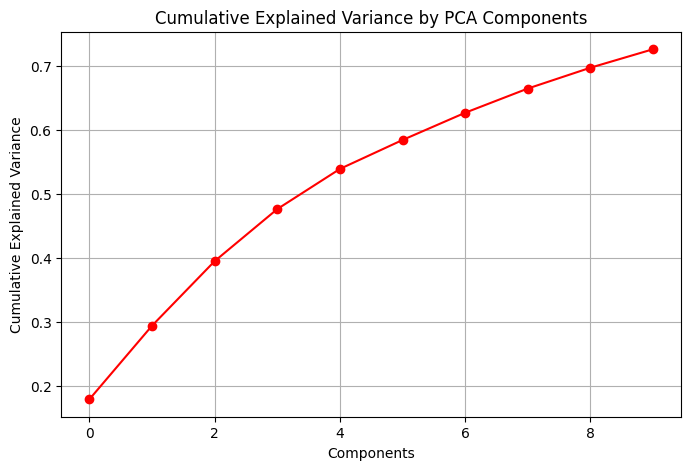

In [14]:
# Explaining variance ratio for each PCA component
plt.figure(figsize=(8, 5))
plt.plot(np.cumsum(pca.explained_variance_ratio_), marker='o', linestyle='-', color='r')
plt.title("Cumulative Explained Variance by PCA Components")
plt.xlabel("Components")
plt.ylabel("Cumulative Explained Variance")
plt.grid()
plt.show()


**Random Forest Classifier**

Trains and evaluates the Random Forest Classifier on the PCA-transformed dataset by predicting the training and test labels and then calculates the accuracy for both datasets.

In [15]:
# Initializing and training a Random Forest Classifier
RF_clf = RandomForestClassifier(random_state=42)
RF_clf.fit(X_train_pca, y_train)

# Making predictions
y_pred_train = RF_clf.predict(X_train_pca)
y_pred_val = RF_clf.predict(X_val_pca)

# Evaluating the model
print("Training Accuracy:", accuracy_score(y_train, y_pred_train))
print("Validation Accuracy:", accuracy_score(y_val, y_pred_val))

Training Accuracy: 1.0
Validation Accuracy: 0.5


**Confusion Matrix (RFC & PCA)**



/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.


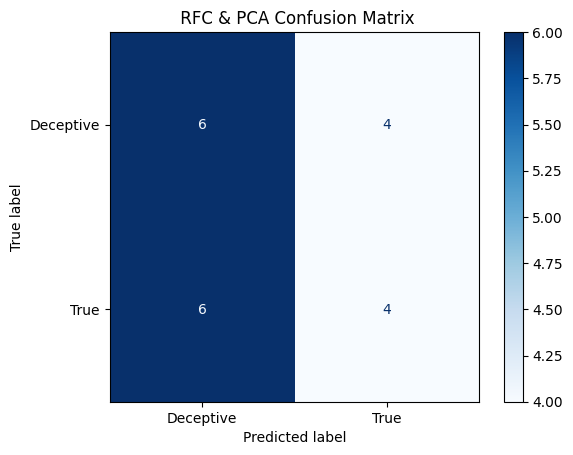

In [16]:
# Generating confusion matrix
cm = confusion_matrix(y_val, y_pred_val)

# Displaying confusion matrix
ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=["Deceptive", "True"]).plot(cmap='Blues')
plt.title(" RFC & PCA Confusion Matrix")
plt.show()

**Support Vector Machine Classifier**

Trains and evaluates the Support Vector Machine Classifier on the PCA-transformed dataset by predicting the training and test labels and then calculates the accuracy for both datasets.

In [17]:
# Initializing and training a Support Vector Machine Classifier
SVM_clf = SVC(kernel='linear', C=1 , random_state=42)
SVM_clf.fit(X_train_pca, y_train)

# Making Predictions
y_pred_train = SVM_clf.predict(X_train_pca)
y_pred_val = SVM_clf.predict(X_val_pca)

# Evaluating the model
print("Training Accuracy:", accuracy_score(y_train, y_pred_train))
print("Validation Accuracy:", accuracy_score(y_val, y_pred_val))

Training Accuracy: 0.7
Validation Accuracy: 0.55


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.


**Confusion Matrix (SVM & PCA)**


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.


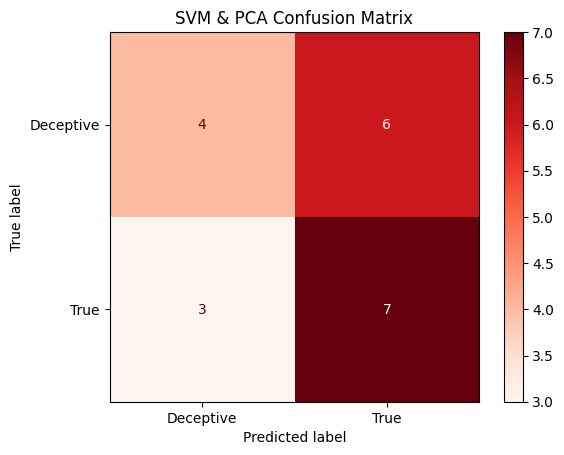

In [18]:
# Generating confusion matrix
cm = confusion_matrix(y_val, y_pred_val)

# Displaying confusion matrix
ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=["Deceptive", "True"]).plot(cmap='Reds')
plt.title("SVM & PCA Confusion Matrix")
plt.show()


**Logistic Regression Classifier**

Trains and evaluates the Logistic Regression Classifier on the PCA-transformed dataset by predicting the training and test labels and then calculates the accuracy for both datasets.

In [19]:
# Initializing and training a Logistic Regression Classifier
LR_clf = LogisticRegression(random_state=42)
LR_clf.fit(X_train_pca, y_train)

# Making Predictions
LR_train_pred = LR_clf.predict(X_train_pca)
LR_val_pred = LR_clf.predict(X_val_pca)

# Evaluating the model
print("Training Accuracy:", accuracy_score(y_train, LR_train_pred))
print("Validation Accuracy:", accuracy_score(y_val, LR_val_pred))


Training Accuracy: 0.6375
Validation Accuracy: 0.4


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.


**Confusion Matrix (LRF & PCA)**

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.


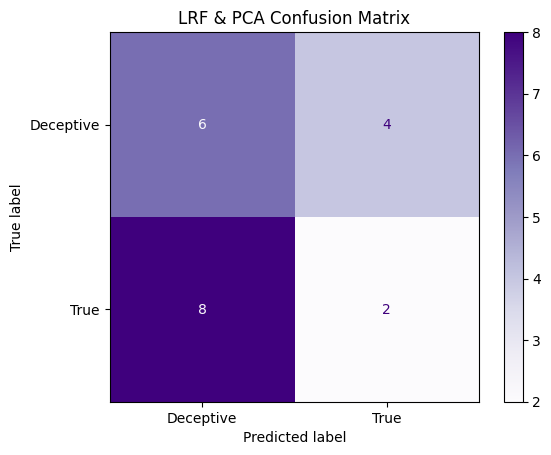

In [20]:
# Generating confusion matrix
cm = confusion_matrix(y_val, LR_val_pred)

# Displaying confusion matrix
ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=["Deceptive", "True"]).plot(cmap='Purples')
plt.title("LRF & PCA Confusion Matrix")
plt.show()

**K-Nearest Neighbors Classifier**

Trains and evaluates the K-Nearest Neighbor Classifier on the PCA-transformed dataset by predicting the training and test labels and then calculates the accuracy for both datasets.

In [21]:

# Initializing and training a K-Nearest Neighbors Classifier
KNN_clf = KNeighborsClassifier(n_neighbors=5)
KNN_clf.fit(X_train_pca, y_train)

# Making Predictions
KNN_train_pred = KNN_clf.predict(X_train_pca)
KNN_val_pred = KNN_clf.predict(X_val_pca)

# Evaluating the model
print("Training Accuracy:", accuracy_score(y_train, KNN_train_pred))
print("Validation Accuracy:", accuracy_score(y_val, KNN_val_pred))

Training Accuracy: 0.675
Validation Accuracy: 0.65


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.


**Confusion Matrix (KNN & PCA)**

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.


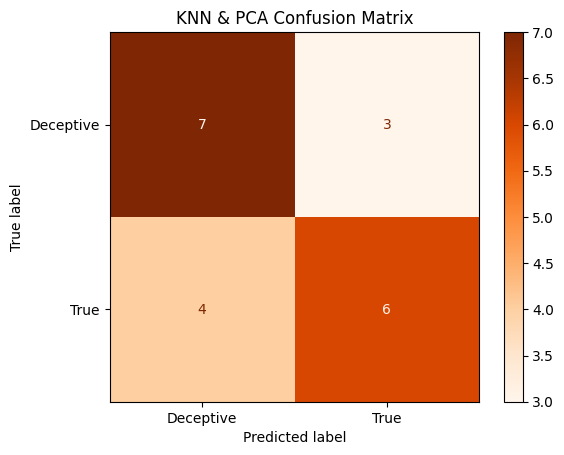

In [22]:
# Generating confusion matrix
cm = confusion_matrix(y_val, KNN_val_pred)

# Displaying confusion matrix
ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=["Deceptive", "True"]).plot(cmap='Oranges')
plt.title("KNN & PCA Confusion Matrix")
plt.show()

In [23]:
# Generating predictions from all models on the PCA-transformed test dataset
rf_predictions = RF_clf.predict(X_val_pca)
svm_predictions = SVM_clf.predict(X_val_pca)
log_reg_predictions = LR_clf.predict(X_val_pca)
knn_predictions = KNN_clf.predict(X_val_pca)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.


In [24]:
# Combines the predictions from the Random Forest and SVM classifiers using majority voting to create a final set of predictions
combined_predictions = np.array([rf_predictions, svm_predictions, log_reg_predictions, knn_predictions]).T
final_predictions = mode(combined_predictions, axis=1)[0].flatten()


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.


In [25]:
# Evaluating the accuracy of the ensemble model
ensemble_accuracy = accuracy_score(y_val, final_predictions)
print("Ensemble Accuracy:", ensemble_accuracy)


Ensemble Accuracy: 0.55


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.


Random Forest Accuracy: 0.5
SVM Accuracy: 0.55
Logistic Regression Accuracy: 0.4
KNN Accuracy: 0.65
Ensemble Accuracy: 0.55


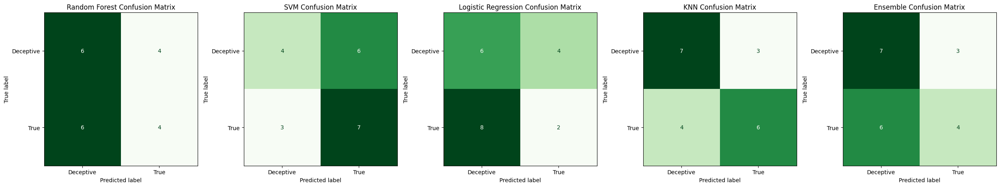

In [26]:
# Calculating individual model accuracies
rf_accuracy = accuracy_score(y_val, rf_predictions)
svm_accuracy = accuracy_score(y_val, svm_predictions)
log_reg_accuracy = accuracy_score(y_val, log_reg_predictions)
knn_accuracy = accuracy_score(y_val, knn_predictions)
ensemble_accuracy = accuracy_score(y_val, final_predictions)

# Print accuracies
print(f"Random Forest Accuracy: {rf_accuracy}")
print(f"SVM Accuracy: {svm_accuracy}")
print(f"Logistic Regression Accuracy: {log_reg_accuracy}")
print(f"KNN Accuracy: {knn_accuracy}")
print(f"Ensemble Accuracy: {ensemble_accuracy}")

# Visualizing all confusion matrices for comparison
fig, axs = plt.subplots(1, 5, figsize=(25, 5))

for ax, cm, title in zip(
    axs,
    [
        confusion_matrix(y_val, rf_predictions),
        confusion_matrix(y_val, svm_predictions),
        confusion_matrix(y_val, log_reg_predictions),
        confusion_matrix(y_val, knn_predictions),
        confusion_matrix(y_val, final_predictions),
    ],
    ["Random Forest", "SVM", "Logistic Regression", "KNN", "Ensemble"]
):
    ConfusionMatrixDisplay(cm, display_labels=["Deceptive", "True"]).plot(ax=ax, cmap='Greens', colorbar=False)
    ax.set_title(f"{title} Confusion Matrix")

plt.tight_layout()
plt.show()


#**Experiments & Results**

**Random Forest Experiment & Results**

The Random Forest Classifier was trained and evaluated on the PCA-transformed dataset. It achieved a perfect training accuracy of 1, correctly classifying all the training samples. While this might seem impressive, it’s likely a sign of overfitting, where the model learns the training data too well, including patterns that don’t generalise to new data. Essentially, the model is memorising the training data instead of learning patterns it can apply to unseen examples. The validation accuracy, however, dropped to 0.5, which shows the model struggled to generalise. The confusion matrix shows that it correctly classified 6 true stories and 6 deceptive stories, but it also misclassified 4 samples from each class. This highlights that the model isn’t identifying the differences between true and deceptive narratives effectively. A big factor here could be the small dataset size. With only 100 samples, the model doesn’t have enough variety to learn patterns that work consistently across different cases. It’s also possible that PCA removed some important features that would’ve helped the model distinguish between the classes. Another issue could be noise in the audio features or inconsistencies in preprocessing that might have affected the data quality. Looking back to address these issues, tuning the Random Forest hyperparameters, like limiting the depth of the trees or reducing the number of trees, to prevent overfitting. Adding more training data or using data augmentation could also give the model more variety to learn from. Finally, tweaking PCA to retain more critical features could improve the model’s ability to separate true and deceptive stories.

**Support Vector Machine Experiment & Results**

The SVM classifier was trained and evaluated on the PCA-transformed dataset, achieving a training accuracy of 0.7, suggesting no overfitting, but a validation accuracy of 0.55, showing it struggled to generalize to unseen data. The confusion matrix highlights its weaknesses, particularly in identifying deceptive stories. It correctly classified 7 true stories but misclassified 3 as deceptive, and correctly classified 4 deceptive stories while misclassifying 6 as true. While SVM performed slightly better than the Random Forest classifier, it still struggled to capture the subtle differences between true and deceptive stories. This is likely due to the small dataset size, limited sample variety, and the linear kernel being too simplistic for the complexity of the task. PCA may also have removed key features needed for accurate classification. To improve results, experimenting with more complex kernels, tuning the regularization parameter further, and collecting more data or applying data augmentation techniques could enhance the model's ability to distinguish between the two classes more effectively.

**Logistic Regression Experiment & Results**

The Logistic Regression Classifier was trained and evaluated on the PCA-transformed dataset. It's got a training accuracy of 0.6375, which shows it struggled to fit the training data properly. The validation accuracy dropped to 0.4, meaning the model had a hard time generalizing unseen data. Looking at the confusion matrix, the model did better with deceptive stories, correctly classifying 6 but misclassifying 4 as true. On the other hand, it struggled with true stories, only getting 2 right while misclassifying 8 as deceptive, this imbalance suggests that the model might favour one class more than the other, likely because of the small dataset size or the reduced features from PCA. Logistic Regression is a simple model, and its performance here highlights that it might not be complex enough to handle the minimal differences between true and deceptive stories. In order to improve, I could look into adding more features, tweaking regularization, or trying alternative preprocessing steps to help the model make better use of the available data.

**K-Nearest Neighbours Experiment & Results**

The KNN Classifier was trained and tested on the PCA-transformed dataset, using 5 neighbors as the parameter. It achieved a training accuracy of 0.675, showing that it was able to learn patterns in the training data to some extent. The validation accuracy was 0.65, which is the highest validation score achieved among the classifiers so far, indicating that KNN performed relatively well in generalizing to unseen data. From the confusion matrix, KNN correctly classified 7 deceptive stories while misclassifying 3 as true. For true stories, it correctly classified 6 and misclassified 4 as deceptive. This balanced performance across both classes shows that KNN was better at distinguishing between the two classes compared to the other models, likely because it doesn’t assume a linear or fixed relationship between the features and labels. KNN’s performance highlights its strength in handling non-linear relationships in the data. However, its reliance on distances in the PCA-reduced feature space may still cause issues if the features are not sufficiently representative of the underlying patterns. To further improve KNN, the number of neighbours could be fine-tuned, additionally, collecting more data could make the KNN algorithm even more effective by providing better-defined clusters for classification.

**Ensemble Experiment & Results**

The ensemble model, which combines predictions from all classifiers using majority voting, got a validation accuracy of 0.55. This is the same as the Random Forest and SVM models, so it didn’t improve overall performance. The confusion matrix shows it correctly classified 7 deceptive stories and 6 true stories, but it misclassified 3 deceptive stories as true and 4 true stories as deceptive. Even though the ensemble balances the strengths of the individual models, it didn’t fully take advantage of the stronger performance of KNN, which had the best accuracy of 0.65. To improve this, I could try weighted voting to give more importance to better-performing models like KNN.



#**Conclusions**

This project focused on building machine learning models to classify narrated stories as true or deceptive. The audio data was preprocessed by resampling to 16 kHz and trimming each recording to 30 seconds. Features were extracted, and PCA was applied to reduce the dataset’s dimensionality, keeping the key patterns while making the training process more efficient. Four classifiers—Random Forest, SVM, Logistic Regression, and KNN—were tested, along with an ensemble model that combined their predictions. KNN performed the best with a validation accuracy of 65%, while Logistic Regression struggled the most. The ensemble balanced predictions from all models but didn’t significantly improve accuracy, showing there’s room to improve how the models are combined. One model that could’ve been explored is Gradient Boosting Machines like XGBoost or LightGBM. These models build on errors from previous predictions, making them great for small datasets and capturing complex patterns. Another option is Neural Networks, especially Long Short-Term Memory networks, which are designed for sequential data like audio. LSTMs could pick up on temporal patterns that other models might miss, potentially improving accuracy.

This project shows that machine learning has potential for detecting deception in audio but also highlights challenges like working with a small dataset and subtle differences between classes. Trying out these alternative models in the future could help improve accuracy and make the approach more reliable for real-world use.

#**References**

GeeksforGeeks (2024) Melfrequency cepstral coefficients (MFCC) for speech recognition. https://www.geeksforgeeks.org/mel-frequency-cepstral-coefficients-mfcc-for-speech-recognition/.

Confusion matrix (no date). https://scikit-learn.org/stable/auto_examples/model_selection/plot_confusion_matrix.html?utm_source=chatgpt.com.

Audio Feature Extractions — Torchaudio 2.5.0 documentation (no date). https://pytorch.org/audio/stable/tutorials/audio_feature_extractions_tutorial.html?utm_source=chatgpt.com.

Sound Feature extraction (2019). https://maelfabien.github.io/machinelearning/Speech9/#2-energy.

Aristorenas, A.J. (2024) Machine Learning Framework for Audio-Based Content Evaluation using MFCC, Chroma, Spectral Contrast, and Temporal Feature Engineering. Stanford University.